In [79]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Path to dataset files, for analysis all fields are considered but for Directed Graph sage classification model only App_description is considered.

path_desc = "/content/drive/MyDrive/play/app_desc.txt"


In [76]:
path_title = "/content/drive/MyDrive/play/title.txt"
path_publisher = "/content/drive/MyDrive/play/publisher.txt"
path_desc = "/content/drive/MyDrive/play/app_desc.txt"
path_tag = "/content/drive/MyDrive/play/app_tag.txt"
path_class = "/content/drive/MyDrive/play/content_class.txt"
path_ratings = "/content/drive/MyDrive/play/ratings.txt"
path_agg_ratings = "/content/drive/MyDrive/play/agg_r.txt"
path_installs = "/content/drive/MyDrive/play/installs.txt"
path_nodes = "/content/drive/MyDrive/play/uniqueNodes.txt"
path_edges = "/content/drive/MyDrive/play/newEdge.txt"

In [77]:
def listOfTuples(l1, l2):
    return list(map(lambda x, y:(x,y), l1, l2))

In [78]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd


G = nx.DiGraph()

nodes = pd.read_csv((path_nodes), sep="," , names=['nodeid','url'])
G.add_nodes_from(nodes['nodeid'])

edges_df = pd.read_csv((path_edges), sep="," , names=['source','target'])
edges = listOfTuples(edges_df['target'], edges_df['source'])
G.add_edges_from(edges)

fig = plt.figure(1, figsize=(200, 80), dpi=60)

nx.draw(G)  
#nx.draw_random(G)  
#nx.draw_circular(G)  
#nx.draw_spectral(G)  
#nx.draw_spring(G)  




Reads all features into a single dataframe called df_fin

In [80]:
import pandas as pd
import numpy as np
import random
#!pip install clean-text

df_title = pd.read_csv((path_title), sep="," , names=['nodeid','title'])
df_pub = pd.read_csv((path_publisher), sep="," , names=['nodeid','Publisher'])
df_desc = pd.read_csv((path_desc), sep="," , names=['nodeid','Description'])
df_tag = pd.read_csv((path_tag), sep="," , names=['nodeid','Tag'])
df_class = pd.read_csv((path_class), sep="," , names=['nodeid','class'])
df_ratings = pd.read_csv((path_ratings), sep="|" , names=['nodeid','Ratings'])
df_agg = pd.read_csv((path_agg_ratings), sep="," , names=['nodeid','Aggregate_rating'])
df_installs = pd.read_csv((path_installs), sep="|" , names=['nodeid','Installs'])

df_fin = pd.DataFrame()

df_fin['nodeid'] = df_title['nodeid']
df_fin['Title'] = df_title['title']
df_fin['Description'] =df_desc['Description']
df_fin['App_tags'] = df_pub['Publisher']
df_fin['Publisher_info'] = df_tag['Tag']
df_fin['Class'] = df_class['class']
df_fin['Ratings'] = df_ratings['Ratings']
df_fin['Agg_Ratings'] = df_agg['Aggregate_rating']
df_fin['installs'] =  df_installs['Installs']


#print(df_fin[''].unique())


df_installs

#df_fin
df_fin

df_ratings

val = df_fin["installs"].isna().sum()
val

df_fin['installs'] = df_fin['installs'].str.replace(r"[\"\',]", '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace(r"[\"\',]", '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace(r"[\"\',]", '')

df_fin['Title'] = df_fin['Title'].str.replace(r"[\"\',]", '')
df_fin['Publisher_info'] = df_fin['Publisher_info'].str.replace(r"[\"\',]", '')
df_fin['Class'] = df_fin['Class'].str.replace(r"[\"\',]", '')

df_fin

df_fin['installs'] = df_fin['installs'].str.replace(r"[\"\',]", '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace(r"[\"\',]", '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace(r"[\"\',]", '')

df_fin['installs'] = df_fin['installs'].str.replace('\W', '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace('\W', '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace('\W', '')

df_fin['Ratings'] = df_fin['Ratings'].replace(np.nan, 0)
#df_fin['installs'] = df_fin['installs'].astype(np.int64)
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].astype(np.int64)
df_fin['Ratings'] = df_fin['Ratings'].astype(np.int64)

df_fin['installs'].unique()
df_fin['Agg_Ratings'].unique()
df_fin['Ratings'].unique()
valnew1 = df_fin.loc[df_fin['installs'].str.contains("Varieswithdevice",na=False ,case=False)]
valnew1

##Handling Nan
df_fin.at[630,'installs']= random.randint(2000, 100000)
df_fin['installs'] = df_fin['installs'].astype(np.int64)



df_fin = df_fin.set_index('nodeid')

In [81]:
!pip install clean-text
#!pip install cleantext
from cleantext import clean

def clean_all(uncleanlist):
  cleandata =[]
  for txt in uncleanlist:
    data = clean(
        txt,
        fix_unicode=True,
        lower=True,
        no_line_breaks=True,
        no_urls=True,
        no_emails=True,
        no_phone_numbers=True,
        no_numbers=True,
        no_digits=True,
        no_currency_symbols=True,
        no_punct=True,
        replace_with_punct='',
        replace_with_url='<URL>',
        replace_with_email='<EMAIL>',
        replace_with_phone_number='<PHONE>',
        replace_with_number='<NUMBER>',
        replace_with_digit='0',
        replace_with_currency_symbol='<CUR>',
        lang='en',
        )
    cleandata.append(data)

  return cleandata



In [85]:
#Cleaning text removing URLS emails and other special characters and converted everything to lower case.

unclean_text = df_desc['Description'].tolist()
desc_clean = clean_all(unclean_text)
len(desc_clean)
#len(unclean_text)

780

In [86]:
df_desc['desc_clean'] = desc_clean
df_desc

,nodeid,Description,desc_clean
0,0,The best Wikipedia experience on your Mobile d...,the best wikipedia experience on your mobile d...
1,1,also called app is one of the best media pla...,also called app is one of the best media playe...
2,2,integrate directly into your WhatsApp sticke...,integrate directly into your whatsapp stickers...
3,3,Meet our NEW version Better and fasterFree mob...,meet our new version better and fasterfree mob...
4,4,Lark player is the it can play all major form...,lark player is the it can play all major forma...
...,...,...,...
775,775,Send any images in any format webp png etc fr...,send any images in any format webp png etc fro...
776,776,Convert mp4 to mp3 video to audio cut video an...,convert mp0 to mp0 video to audio cut video an...
777,777,PicShot photo editor app comes with many one t...,picshot photo editor app comes with many one t...
778,778,SPARKvue is a popular data collection visualiz...,sparkvue is a popular data collection visualiz...


In [87]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
#tokenize and tag the card text
card_docs = [TaggedDocument(doc.split(' '), [i]) 
             for i, doc in enumerate(df_desc.desc_clean)]
#display the tagged docs
card_docs
model = Doc2Vec(vector_size=64, min_count=1, epochs = 200)
#instantiate model
model = Doc2Vec(vector_size=64, window=4, min_count=1, workers=8, epochs = 200)
#build vocab
model.build_vocab(card_docs)
#train model
model.train(card_docs, total_examples=model.corpus_count
            , epochs=model.epochs)

In [88]:
import numpy as np

card2vec = [model.infer_vector((df_desc['desc_clean'][i].split(' '))) 
            for i in range(0,len(df_desc['desc_clean']))]
card2vec
card2VecRandomVectors = model.infer_vector(["system", "response"])
#Create a list of lists
dtv_emb= np.array(card2vec).tolist()



Finding similarity after an unsupervised Doctovec model is trained.Finding similarity to the app with word ("whatsapp") similarity using most_similar method

In [89]:

md = model.docvecs.most_similar([model.infer_vector("whatsapp")])
for i,k in md:
  print(df_fin.iloc[i])


Title                                         Zoom for Chrome - PWA
Description       The Zoom for Chrome Progressive Web App PWA de...
App_tags                                                   Business
Publisher_info                                              zoom.us
Class                                                      Everyone
Ratings                                                        3396
Agg_Ratings                                                      32
installs                                                    1000000
Name: 368, dtype: object
Title                                            WhatsApp Wallpaper
Description       Wallpaper package to support WhatsApp Messenge...
App_tags                                            Personalization
Publisher_info                                         WhatsApp LLC
Class                                                      Everyone
Ratings                                                     3339883
Agg_Ratings            

In [90]:
df_features = pd.DataFrame.from_records(dtv_emb)
df_features.insert(0, 'nodeid', df_desc['nodeid'])

df_features = df_features.set_index("nodeid")
#df_embeddings

df_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
nodeid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-1.213316,1.794353,-0.944126,-0.537977,-2.669892,5.614669,-0.945537,5.337430,1.100133,-3.697333,0.425891,0.650388,-0.033160,-1.872310,-0.749923,-0.294599,-0.669845,2.699766,1.701770,0.066201,-4.045092,3.294352,-5.710180,3.789659,-1.405776,-4.313396,2.099805,1.595709,1.096726,3.078933,-5.103999,2.869514,1.250382,1.208781,3.559272,3.898199,2.287460,-1.868506,4.648380,4.381711,5.084778,-2.142027,0.100698,1.938463,-0.432614,-1.726266,1.338430,2.008588,-1.825182,-2.716059,-3.693323,-3.050388,1.244692,-1.708295,-3.739379,-0.493044,0.939607,-2.617836,6.692201,-4.268148,2.593437,-0.388177,-4.620807,1.660424
1,4.884782,0.601284,-2.164683,-3.540415,3.331995,0.184185,4.147270,3.591404,-1.887288,0.667295,-1.994181,0.525969,2.796037,-3.180724,0.202436,0.735644,1.027505,0.854161,-2.320252,-3.435185,-0.725231,4.974361,-0.587583,3.549640,0.373302,3.230774,4.598621,0.709317,-1.108616,2.418921,0.252399,0.486717,0.638711,-2.602221,4.856030,-0.267850,0.923657,3.760255,-0.156855,2.969009,4.882174,2.277217,-2.049634,0.132245,1.843180,0.923745,-0.495461,-0.874294,2.489841,3.812334,2.091558,1.182472,-3.168866,0.420152,1.351042,-5.314338,1.471888,-0.958278,2.020662,-3.867223,0.419215,1.413481,-7.296901,-1.628056
2,2.128297,-5.035716,-1.732144,1.401093,2.539108,3.202105,-3.035219,1.384525,6.800954,-2.569701,-3.034608,3.286219,1.091311,4.172027,5.035148,-2.600959,-2.539985,0.018446,1.393630,0.703172,-1.737469,-1.846964,-3.622521,2.074080,0.862576,-3.478803,0.276763,-1.214203,1.400215,-0.766284,0.372685,0.493421,-1.309686,-2.730173,3.919658,-0.178258,-1.704731,-3.248962,2.072947,5.584491,1.827368,-0.221517,3.051618,-1.838546,-1.100907,-2.956557,-0.374817,2.100974,1.997978,0.535729,-4.257578,-0.139278,-4.881807,-0.328596,-1.626677,-3.639345,3.542691,-0.262258,-1.386041,-1.861788,-0.352650,-7.949479,-3.217884,-1.485149
3,4.121434,-0.263198,-2.873445,-3.361682,-2.634779,2.078294,0.003765,1.755819,-1.400901,-0.195072,-0.818278,1.254317,0.413700,5.284774,2.965723,-0.686854,0.545034,1.514112,-0.585265,-1.368508,-1.241587,4.163322,-2.108726,4.464657,3.437656,1.386299,3.610664,-0.500005,2.358829,5.298291,-0.806752,-4.989313,2.925472,-0.630656,2.257797,1.687464,3.307839,-6.146432,-2.131619,5.226459,5.432502,-0.309100,0.406667,2.174318,3.297867,1.498695,-4.059673,-1.005471,2.383146,0.079635,2.522502,-8.729135,-1.544689,0.209412,-1.878543,-6.820500,-0.380407,-0.560795,3.559897,-3.618363,4.509179,1.421874,-1.554671,-3.226482
4,0.297202,0.225796,2.816766,-0.648917,4.476048,-0.561770,3.232858,3.936333,-1.102772,2.002361,-0.253715,0.342853,2.899776,1.579836,1.586068,1.529735,-1.683296,-1.211641,0.484598,-6.425796,-0.719108,2.718313,-4.308980,2.383742,2.387765,1.052147,5.990787,0.880743,-3.181086,2.999224,-3.344741,2.124187,3.786631,0.299061,5.514726,-3.830871,-0.109003,2.725073,-0.054341,2.025414,2.170349,-1.725682,-4.174265,1.769643,5.318510,-2.225240,0.268550,-0.152614,0.520755,1.327027,1.306611,-3.897803,-0.550425,1.583737,1.226181,-2.984021,0.355693,0.792555,1.226214,-0.287755,2.441283,3.523785,-6.487885,-0.617811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
775,0.586850,-0.084366,0.001290,0.919403,2.853479,-0.966240,-4.700686,1.279250,0.380593,-0.695179,0.647291,1.991421,-1.822193,4.528841,4.265757,0.495504,-3.177485,2.045174,-1.941560,-3.020808,0.544639,4.048317,-1.854331,4.601191,0.482628,0.159199,-1.420505,0.531946,3.107028,7.330836,-1.767244,0.834225,0.687788,0.641037,1.809641,-3.642362,-1.372646,-3.794460,-3.189053,5.377242,4.906898,-4.645483,1.949290,1.441283,1.490429,0.705754,-0.803819,1.443876,

In [91]:
s = df_fin.App_tags.value_counts().index[:4]
def categ(x,s):
    if x in s:
        return x
    else : 
        return "Others"

df_fin['broad_genre']= df_fin.App_tags.apply(lambda x : categ(x,s))

In [92]:
from sklearn import preprocessing

df_fin_new = df_fin.drop('Title', 1)
df_fin_new = df_fin_new.drop('Description', 1)
df_fin_new
cols = ['App_tags','Class', 'Publisher_info','broad_genre']
df_fin_new[cols] = df_fin_new[cols].astype('category')
df_fin_new.info()
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'species'.
df_fin_new['App_tags']= label_encoder.fit_transform(df_fin_new['App_tags'])
df_fin_new['Class']= label_encoder.fit_transform(df_fin_new['Class'])
df_fin_new['Publisher_info']= label_encoder.fit_transform(df_fin_new['Publisher_info'])
df_fin_new['broad_genre']= label_encoder.fit_transform(df_fin_new['broad_genre'])
df_fin_new

#df_fin_new
df_fin_new['broad_genre']


<class 'pandas.core.frame.DataFrame'>
Int64Index: 780 entries, 0 to 779
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   App_tags        780 non-null    category
 1   Publisher_info  780 non-null    category
 2   Class           780 non-null    category
 3   Ratings         780 non-null    int64   
 4   Agg_Ratings     780 non-null    int64   
 5   installs        780 non-null    int64   
 6   broad_genre     780 non-null    category
dtypes: category(4), int64(3)
memory usage: 54.1 KB


nodeid
0      2
1      1
2      2
3      2
4      1
      ..
775    0
776    2
777    3
778    2
779    0
Name: broad_genre, Length: 780, dtype: int64

In [93]:
df_fin_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 780 entries, 0 to 779
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   App_tags        780 non-null    int64
 1   Publisher_info  780 non-null    int64
 2   Class           780 non-null    int64
 3   Ratings         780 non-null    int64
 4   Agg_Ratings     780 non-null    int64
 5   installs        780 non-null    int64
 6   broad_genre     780 non-null    int64
dtypes: int64(7)
memory usage: 48.8 KB


In [94]:
df_features['label'] = df_fin_new['broad_genre']
feature_names = set(df_features.columns) - {"nodeid", "label"}
num_features = len(feature_names)
print ("num_features:", num_features)
num_classes = set(df_features['label'].tolist())
print("num_classes:", num_classes)

num_features: 64
num_classes: {0, 1, 2, 3, 4}


In [95]:
df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,667888,45,50000000,2
1,20,477,0,70273,48,1000000,1
2,29,336,3,152136,46,10000000,2
3,13,270,0,796800,45,50000000,2
4,20,214,3,2679619,46,100000000,1
...,...,...,...,...,...,...,...
775,11,400,0,28065,44,5000000,0
776,34,178,0,376036,48,10000000,2
777,23,232,0,290706,45,10000000,3


In [96]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
df_fin_new['Ratings'] = scaler.fit_transform(df_fin_new['Ratings'].values.reshape(-1,1))
df_fin_new['Agg_Ratings'] = scaler.fit_transform(df_fin_new['Agg_Ratings'].values.reshape(-1,1))
df_fin_new['installs'] = scaler.fit_transform(df_fin_new['installs'].values.reshape(-1,1))
#from sklearn.preprocessing import OrdinalEncoder
#ord_enc = OrdinalEncoder()
#df_fin_new["Publisher_info"] = ord_enc.fit_transform(df_fin_new["Publisher_info"].values.reshape(-1,1))


#et(df_fin_new['Publisher_info'])

In [97]:
train, validate, test = \
              np.split(df_features.sample(frac=1, random_state=42), 
                       [int(.6*len(df_features)), int(.8*len(df_features))])
              
train
validate
test

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,label
nodeid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768,2.743118,-0.799499,-1.543458,0.753967,-1.981049,1.272235,0.826829,-1.572849,0.734978,-0.815872,-2.443764,-1.769714,2.508014,2.312912,5.293104,2.297980,0.239062,1.266793,1.414054,0.904653,-0.712509,-0.285944,-0.412116,4.799552,0.310951,-0.127734,4.193430,-3.872743,1.018768,3.552134,-7.657669,-3.543484,-0.081544,2.659387,3.113636,0.386935,3.212568,-3.613350,-1.265346,-0.812897,3.178880,-2.457587,2.599446,5.029697,-4.974697,-0.044270,-1.403672,-2.941759,0.643917,-0.450409,-1.757765,-0.314325,1.652606,-0.315130,0.917777,-1.519495,3.817204,1.850968,-2.644864,-2.015885,0.602973,-2.243921,-6.803486,-3.123415,4
721,-0.085575,-2.061531,-5.403590,3.975482,1.278317,1.776037,-3.492907,1.264428,-2.771152,-1.334445,-5.223285,3.154201,1.475367,4.122349,1.173270,-4.319256,-1.318722,-0.025021,0.264110,-2.561565,-0.886546,1.427154,1.442690,-1.647492,-4.724901,3.543210,-0.243958,0.374810,5.455778,-0.184800,-3.894030,-4.084501,-1.723526,2.991156,1.581777,-2.914112,3.322794,0.063323,-0.784765,2.913594,-5.493942,-1.470654,2.784328,4.780431,3.199744,-3.173921,0.281920,-2.125695,0.813764,0.383318,3.780350,-1.060117,-6.273850,-3.772714,1.851902,-3.056205,1.954355,-3.169928,1.192870,-0.585260,-1.298226,-3.111052,-10.223836,1.252137,3
703,1.164472,-2.602645,2.052982,-2.224437,4.028231,0.089985,1.605687,0.891774,3.270665,-1.507321,-1.047679,2.471569,4.334906,0.115130,4.527292,-1.367146,-0.174349,-0.642563,-0.664019,-2.308841,4.031729,1.970562,-2.182514,5.223220,4.413171,-1.132360,2.601626,-1.462080,-3.399508,0.559807,0.337237,-2.771569,-1.987405,0.512953,4.280543,-1.422085,-2.582191,1.852765,0.535940,2.965196,-2.663385,4.593974,-2.208243,-0.817577,3.477193,0.140190,-1.371864,-1.181331,-2.344402,-2.192471,-0.575128,-2.076320,-1.073338,-3.603676,1.247371,-2.550355,1.521235,-3.891986,0.179767,1.358043,-2.992279,-0.090650,-2.838760,-3.128370,2
619,-0.899454,-1.657989,-1.352532,-1.177140,5.004582,0.550879,1.312197,1.712204,3.986501,-3.233855,-3.334013,5.126507,0.844707,-0.834719,2.789922,-2.097385,-1.359100,3.759374,-0.185770,2.791455,-1.923362,2.753115,-2.500881,4.923988,-1.878176,-2.567947,-1.373101,-5.807755,0.527149,3.333374,-4.028746,-0.265023,-4.312952,0.257868,6.698000,0.420818,0.112366,-1.451080,0.377061,4.713522,5.644763,0.388966,-0.241455,-1.324024,-0.287612,-0.568472,-1.596153,2.463909,-1.995117,-2.701651,2.520016,-2.820718,-0.876063,-3.749934,0.430589,-2.285025,3.719559,-2.508439,1.583925,-2.593493,0.114208,-2.904660,-2.197247,-2.446035,2
667,-0.188786,-0.920073,0.037172,0.400384,5.460716,5.576486,-1.158856,3.056693,-2.213074,-2.331006,-1.172391,2.657485,-0.014245,1.869324,0.989234,0.296982,0.253792,1.604573,0.027351,-3.743042,0.376587,1.937660,-1.762875,2.577183,-2.572562,0.571065,3.452781,-1.101124,-1.063858,2.827695,-1.212559,1.594785,-1.157084,-2.621833,7.835449,-1.597307,3.574052,4.589253,-1.650726,2.661475,2.013572,-2.364772,-0.887604,-3.682861,-6.203143,-0.828284,-0.027434,-2.332267,2.075302,-1.317094,-2.789392,-2.630777,1.777018,-1.395730,-0.143497,-1.999415,-0.436791,-2.380894,-2.059633,3.453778,-1.443039,-3.386935,-4.232107,-1.547580,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,2.767552,0.033145,0.113066,5.833125,1.010137,2.855869,-1.533779,1.472822,1.346492,-0.712102,1.225317,-0.006372,-0.667893,5.667601,2.908778,0.260750,-1.154389,1.545955,-1.354090,-3.011625,-0.721779,-0.206511,2.664582,1.945574,-2.835013,-1.112075,0.429619,-0.290335,-0.191606,4.362313,-2.282902,-4.937764,-0.358319,4.434467,-2.031418,-1.959224,1.514260,-2.991253,-0.527840,1.362105,0.25673

In [100]:
x_train = train[feature_names].to_numpy()
x_valid = validate[feature_names].to_numpy()
x_test = test[feature_names].to_numpy()
# Create train and test targets as a numpy array.
y_train = train["label"]
y_valid = validate["label"]
y_test = test["label"]

set(y_test)

{0, 1, 2, 3, 4}

In [101]:
from sklearn import preprocessing, feature_extraction, model_selection

target_encoding = preprocessing.LabelBinarizer()
train_targets = target_encoding.fit_transform(y_train)
val_targets = target_encoding.transform(y_valid)
test_targets = target_encoding.transform(y_test)



In [102]:
!pip install stellargraph
import pandas as pd
import os
import stellargraph as sg
from stellargraph.mapper import DirectedGraphSAGENodeGenerator
from stellargraph.layer import DirectedGraphSAGE

from tensorflow.keras import layers, optimizers, losses, metrics, Model
from sklearn import preprocessing, feature_extraction, model_selection
from stellargraph import datasets
from IPython.display import display, HTML
import matplotlib.pyplot as plt
%matplotlib inline
from stellargraph import StellarDiGraph

no_cat_g = StellarDiGraph({"node": df_features}, {"links": edges_df})
print(no_cat_g.info())

batch_size = 256
in_samples = [5, 2]
out_samples = [5, 2]

generator = DirectedGraphSAGENodeGenerator(no_cat_g, batch_size, in_samples, out_samples)
train_gen = generator.flow(y_train.index, train_targets, shuffle=True)

graphsage_model = DirectedGraphSAGE(
    layer_sizes=[64, 64], generator=generator, bias=False, dropout=0.2,
)

x_inp, x_out = graphsage_model.in_out_tensors()
prediction = layers.Dense(units=train_targets.shape[1], activation="softmax")(x_out)

##
model = Model(inputs=x_inp, outputs=prediction)
model.compile(
    optimizer=optimizers.Adam(lr=0.001),
    loss=losses.categorical_crossentropy,
    metrics=["acc"],
)

val_gen = generator.flow(y_valid.index, val_targets)

history = model.fit(
    train_gen, epochs=200, validation_data=val_gen, verbose=2, shuffle=False
)

StellarDiGraph: Directed multigraph
 Nodes: 780, Edges: 2778

 Node types:
  node: [780]
    Features: float32 vector, length 65
    Edge types: node-links->node

 Edge types:
    node-links->node: [2778]
        Weights: all 1 (default)
        Features: none


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/200
2/2 - 3s - loss: 1.5825 - acc: 0.2564 - val_loss: 1.5336 - val_acc: 0.3654 - 3s/epoch - 1s/step
Epoch 2/200
2/2 - 0s - loss: 1.5430 - acc: 0.3675 - val_loss: 1.4881 - val_acc: 0.5128 - 425ms/epoch - 213ms/step
Epoch 3/200
2/2 - 1s - loss: 1.4965 - acc: 0.4530 - val_loss: 1.4444 - val_acc: 0.5769 - 759ms/epoch - 379ms/step
Epoch 4/200
2/2 - 1s - loss: 1.4701 - acc: 0.5235 - val_loss: 1.4143 - val_acc: 0.5769 - 1s/epoch - 508ms/step
Epoch 5/200
2/2 - 0s - loss: 1.4449 - acc: 0.5278 - val_loss: 1.3836 - val_acc: 0.5769 - 391ms/epoch - 196ms/step
Epoch 6/200
2/2 - 0s - loss: 1.4092 - acc: 0.5385 - val_loss: 1.3609 - val_acc: 0.5769 - 398ms/epoch - 199ms/step
Epoch 7/200
2/2 - 1s - loss: 1.3951 - acc: 0.5385 - val_loss: 1.3409 - val_acc: 0.5769 - 540ms/epoch - 270ms/step
Epoch 8/200
2/2 - 0s - loss: 1.3832 - acc: 0.5385 - val_loss: 1.3231 - val_acc: 0.5769 - 416ms/epoch - 208ms/step
Epoch 9/200
2/2 - 0s - loss: 1.3601 - acc: 0.5385 - val_loss: 1.3129 - val_acc: 0.5769 - 431ms/ep

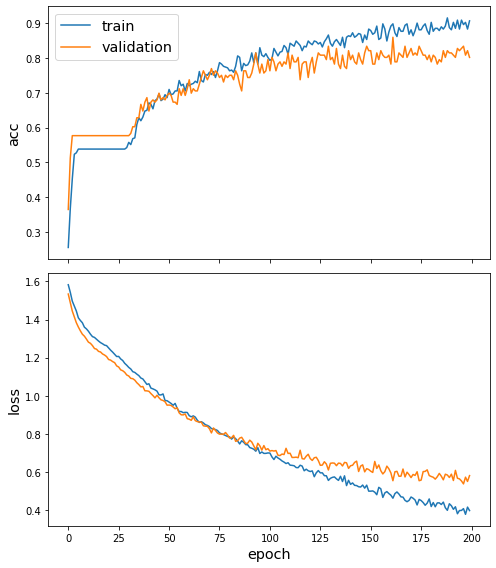

In [103]:
sg.utils.plot_history(history)

In [104]:
test_nodes = test.index
test_mapper = generator.flow(y_test.index, test_targets)
test_predictions = model.predict(test_mapper)
test_predictions

test_node_predictions = target_encoding.inverse_transform(test_predictions)
#print(test_node_predictions)
fin = label_encoder.inverse_transform(test_node_predictions);
true_y = label_encoder.inverse_transform(test['label']);

true_y
fin

le_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(le_name_mapping)

{'Communication': 0, 'Music & Audio': 1, 'Others': 2, 'Photography': 3, 'Tools': 4}


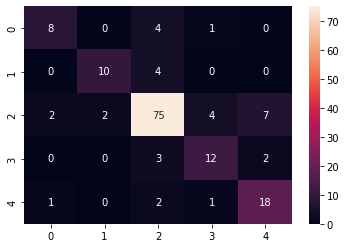

In [106]:
import numpy as np
from sklearn.metrics import precision_recall_fscore_support

precision_recall_fscore_support(true_y, fin, average='macro')


from sklearn import metrics
cm = metrics.confusion_matrix(true_y, fin)

import seaborn as sns
sns.heatmap(cm, annot=True)

In [107]:
import numpy as np


def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="red" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="red" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

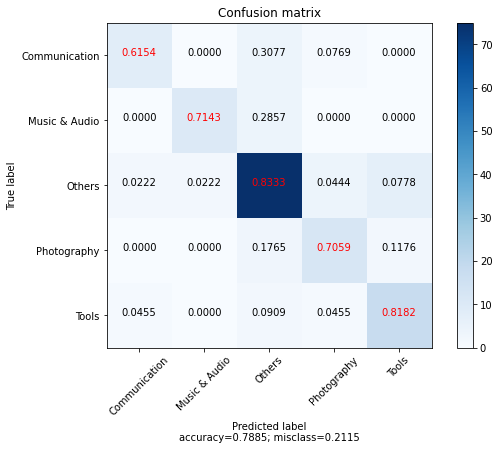

In [108]:
target = ['Communication', 'Music & Audio', 'Others', 'Photography', 'Tools']

plot_confusion_matrix(cm,target)

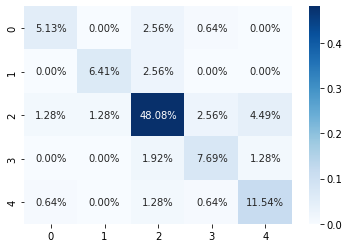

In [109]:
sns.heatmap(cm/np.sum(cm), annot=True, 
            fmt='.2%', cmap='Blues')

In [36]:
history

In [110]:
df_test_preds = pd.DataFrame()
df_test_preds.insert(0, 'preds', fin.tolist())
actual_lab = label_encoder.inverse_transform(test['label'].tolist());
df_test_preds.insert(1, 'actual',actual_lab)

df_test_preds.iloc[17]

preds     Others
actual    Others
Name: 17, dtype: object

In [111]:
all_nodes = df_features.index
embedding_model = Model(inputs=x_inp, outputs=x_out)
all_mapper = generator.flow(df_features.index, df_features['label'])


embedding_model = Model(inputs=x_inp, outputs=x_out)
emb = embedding_model.predict(all_mapper)
emb.shape


(780, 64)

In [113]:
!pip install umap-learn
!pip install umap-learn[plot]

import pandas as pd
import umap
import umap.plot

# Used to get the data
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Some plotting libraries
import matplotlib.pyplot as plt
%matplotlib notebook
from bokeh.plotting import show, save, output_notebook, output_file
from bokeh.resources import INLINE
output_notebook(resources=INLINE)



embedding = umap.UMAP(n_components=2, metric='cosine').fit(emb)




     |████████████████████████████████| 86 kB 2.5 MB/s 
     |████████████████████████████████| 1.1 MB 27.0 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=96add466c5a3d0c6160bee8948a0b89edf9448067694bca29407b6c69dbe6d96
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=e85742b0e70c7bb245e80e24d0e831b22fa083946d6123f123a2ba844e7a43de
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent
     |████████████████████████████████| 15.8 MB 4.7 MB/s 
     |████████████████████████████████| 76 kB 4.4 MB/s 
     |████████████████████████████████| 802 kB 45.4 MB/s 
     |████████████████████████████████| 132 kB 59.3 MB/s 
     |████████████████████████████████| 802 kB 23.6 MB/s 
     |██████████████████

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


In [114]:
embedding.embedding_.shape

(780, 2)

In [115]:
df_fin_new['broad_genre']

nodeid
0      2
1      1
2      2
3      2
4      1
      ..
775    0
776    2
777    3
778    2
779    0
Name: broad_genre, Length: 780, dtype: int64

In [117]:
import umap.plot

f = umap.plot.points(embedding, labels=df_fin_new['broad_genre'])


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dimensionality reduction and plotting embeddings in 2D space to check for cluster seperation.

In [119]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np


X = emb
y = np.argmax(target_encoding.transform(df_features['label']), axis=1)


if X.shape[1] > 2:
    transform = TSNE  # PCA

    trans = transform(n_components=2)
    emb_transformed = pd.DataFrame(trans.fit_transform(X), index=df_features.index)
    emb_transformed["label"] = y
else:
    emb_transformed = pd.DataFrame(X, index=df_features.index)
    emb_transformed = emb_transformed.rename(columns={"0": 0, "1": 1})
    emb_transformed["label"] = y

alpha = 0.7

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(
    emb_transformed[0],
    emb_transformed[1],
    c=emb_transformed["label"].astype("category"),
    cmap="jet",
    alpha=alpha,
)
ax.set(aspect="equal", xlabel="$X_1$", ylabel="$X_2$")
plt.title(
    "{} visualization of GraphSAGE embeddings for complete dataset".format(transform.__name__)
)
plt.show()



/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [120]:
plt.show()


## Experimental section..

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_fin_new['Ratings'] = scaler.fit_transform(df_fin_new['Ratings'].values.reshape(-1,1))
df_fin_new['Agg_Ratings'] = scaler.fit_transform(df_fin_new['Agg_Ratings'].values.reshape(-1,1))
df_fin_new['installs'] = scaler.fit_transform(df_fin_new['installs'].values.reshape(-1,1))

df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,0.004421,0.90,0.004999,2
1,20,477,0,0.000465,0.96,0.000099,1
2,29,336,3,0.001007,0.92,0.000999,2
3,13,270,0,0.005274,0.90,0.004999,2
4,20,214,3,0.017737,0.92,0.009999,1
...,...,...,...,...,...,...,...
775,11,400,0,0.000186,0.88,0.000499,0
776,34,178,0,0.002489,0.96,0.000999,2
777,23,232,0,0.001924,0.90,0.000999,3


In [ ]:
df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,0.004421,0.90,0.004999,2
1,20,477,0,0.000465,0.96,0.000099,1
2,29,336,3,0.001007,0.92,0.000999,2
3,13,270,0,0.005274,0.90,0.004999,2
4,20,214,3,0.017737,0.92,0.009999,1
...,...,...,...,...,...,...,...
775,11,400,0,0.000186,0.88,0.000499,0
776,34,178,0,0.002489,0.96,0.000999,2
777,23,232,0,0.001924,0.90,0.000999,3


In [ ]:
df_fin_new['broad_genre'].unique()

array([2, 1, 4, 0, 3])

In [ ]:
feature_names = set(df_fin_new.columns) - {"nodeid", "broad_genre"}
num_features = len(feature_names)
print ("num_features:", num_features)
num_classes = set(df_fin_new['broad_genre'].tolist())
print("num_classes:", num_classes)

num_features: 6
num_classes: {0, 1, 2, 3, 4}


In [ ]:
x_train = train[feature_names].to_numpy()
x_valid = validate[feature_names].to_numpy()
# Create train and test targets as a numpy array.
y_train = train["broad_genre"]
y_valid = validate["broad_genre"]

x_valid

dfg = pd.DataFrame(x_train)
dfg

,0,1,2,3,4,5
0,11.0,0.0,0.000250,0.000999,296.0,0.74
1,29.0,3.0,0.002268,0.000999,459.0,0.78
2,20.0,0.0,0.005584,0.000999,466.0,0.92
3,32.0,0.0,0.000152,0.000499,452.0,0.80
4,2.0,0.0,0.000006,0.000009,268.0,0.50
...,...,...,...,...,...,...
463,0.0,1.0,0.008786,0.009999,68.0,0.88
464,32.0,3.0,0.005429,0.009999,101.0,0.90
465,32.0,0.0,0.000085,0.000099,230.0,0.88
466,22.0,0.0,0.000138,0.000099,81.0,0.94
